**Objective:**<br> Create a Python script or notebook that combines NLP, Computer Vision, Machine Learning, and Data Visualization to analyze and understand a dataset of book summaries. This involves cleaning the data, exploring its characteristics through EDA, shortening the summaries, and transforming them into images.
<br>

**Requirements:**
1. Data Preprocessing and EDA:
   - Clean the data by handling missing values.
   - Explore the dataset to understand its characteristics.
2. NLP Component:
   - Condense the book summaries to make them shorter.
3. Computer Vision Component:
   - Convert the condensed text summaries into images using a Text-to-Image model.

**Output:**<br>
The script should provide:
- The condensed text summaries.
- The converted images.
- The findings from the exploratory data analysis.

**Data:**<br>
[Data Link -(Shared Google Drive)](https://drive.google.com/file/d/1PDujXAkSelYQ8KX_vBGwDr6EkMhJXlA3/view?usp=share_link)

**Deadline:**<br>
April 30, 2024

## 0. imports

In [25]:
import torch
import requests
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image
from io import BytesIO
from tqdm.notebook import tqdm
from collections import Counter
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from IPython.display import display
from diffusers import StableDiffusionPipeline
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from transformers import T5ForConditionalGeneration, T5Tokenizer

## 1. Data Preprocessing and EDA

### Data Loading

In [ ]:
# !gdown 1PDujXAkSelYQ8KX_vBGwDr6EkMhJXlA3
!gdown 18V2SLFbkbF_KoGDteT8t1FIF6pmTDnse

Downloading...
From: https://drive.google.com/uc?id=18V2SLFbkbF_KoGDteT8t1FIF6pmTDnse
To: /content/booksummaries.txt
100% 43.5M/43.5M [00:00<00:00, 81.1MB/s]


In [ ]:
df_book = pd.read_csv('./booksummaries.txt', sep='\t', names=['id', 'Freebase ID', 'title', 'author', 'date', 'genre', 'summary'])
df_book

,id,Freebase ID,title,author,date,genre,summary
0,620,/m/0hhy,Animal Farm,George Orwell,1945-08-17,"{""/m/016lj8"": ""Roman \u00e0 clef"", ""/m/06nbt"":...","Old Major, the old boar on the Manor Farm, ca..."
1,843,/m/0k36,A Clockwork Orange,Anthony Burgess,1962,"{""/m/06n90"": ""Science Fiction"", ""/m/0l67h"": ""N...","Alex, a teenager living in near-future Englan..."
2,986,/m/0ldx,The Plague,Albert Camus,1947,"{""/m/02m4t"": ""Existentialism"", ""/m/02xlf"": ""Fi...",The text of The Plague is divided into five p...
3,1756,/m/0sww,An Enquiry Concerning Human Understanding,David Hume,NaN,NaN,The argument of the Enquiry proceeds by a ser...
4,2080,/m/0wkt,A Fire Upon the Deep,Vernor Vinge,NaN,"{""/m/03lrw"": ""Hard science fiction"", ""/m/06n90...",The novel posits that space around the Milky ...
...,...,...,...,...,...,...,...
16554,36934824,/m/0m0p0hr,Under Wildwood,Colin Meloy,2012-09-25,NaN,"Prue McKeel, having rescued her brother from ..."
16555,37054020,/m/04f1nbs,Transfer of Power,Vince Flynn,2000-06-01,"{""/m/01jfsb"": ""Thriller"", ""/m/02xlf"": ""Fiction""}",The reader first meets Rapp while he is doing...
16556,37122323,/m/0n5236t,Decoded,Jay-Z,2010-11-16,"{""/m/0xdf"": ""Autobiography""}",The book follows very rough chronological ord...
16557,37132319,/m/0n4bqb1,America Again: Re-becoming The Greatness We Ne...,Stephen Colbert,2012-10-02,NaN,Colbert addresses topics including Wall Stree...


### Exploratory Data Analysis

#### Describe Lengths

In [2]:
def describe_lengths(data, column_name):
    column_data = data[column_name]
    lengths = column_data.str.split().apply(len)

    min_length = lengths.min()
    mean_length = lengths.mean()
    max_length = lengths.max()

    print(f"Summary Statistics of {column_name}:")
    print(f"Minimum length: {min_length}")
    print(f"Mean length: {mean_length}")
    print(f"Maximum length: {max_length}")
    print()

#### Word Cloud

In [ ]:
def word_cloud(data):
    titles_text = ' '.join(data)
    wordcloud = WordCloud(width=800, height=400, background_color ='white').generate(titles_text)
    plt.figure(figsize=(15, 10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title('Word Cloud of Book Titles')
    plt.show()
    print()

#### Temporal Analysis

In [ ]:
def temporal_analysis(data, s=10):
    data['date'] = pd.to_datetime(data['date'], errors='coerce')
    data['year'] = data['date'].dt.year

    # Perform binning (s years per bin)
    min_year = data['year'].min()
    max_year = data['year'].max()
    num_bins = int((max_year - min_year) / s) + 1
    bins = np.linspace(min_year, max_year, num_bins, dtype=int)

    # Group books into bins
    data['year_bin'] = pd.cut(data['year'], bins=bins, labels=[f'{bins[i]}-{bins[i+1]}' for i in range(len(bins)-1)])

    # Plot the number of books published in each bin (log scale)
    plt.figure(figsize=(15, 8))
    ax = data['year_bin'].value_counts().sort_index().plot(kind='bar')
    ax.set_yscale('log')
    plt.title(f'Number of Books Published in {s}-Year Intervals (Log Scale)')
    plt.xlabel('Year Range')
    plt.ylabel('Number of Books (log scale)')
    # plt.xticks(rotation=45)
    plt.show()
    print()

#### Most Common Words

In [ ]:
def most_common_words(dataframe, column_name, top_n=30):
    column_data = dataframe[column_name]
    combined_text = ' '.join(column_data)
    words = combined_text.lower().split()
    word_counts = Counter(words)
    most_common = word_counts.most_common(top_n)

    # Plot word frequency
    plt.figure(figsize=(5, 10))
    plt.barh([word[0] for word in most_common], [word[1] for word in most_common])
    plt.title(f'Top {top_n} Most Common Words in {column_name.capitalize()}')
    plt.xlabel('Frequency')
    plt.ylabel('Word')
    plt.gca().invert_yaxis()
    plt.xscale('log')
    plt.show()
    print()

#### Run EDA

Summary Statistics of title:
Minimum length: 1
Mean length: 3.300923968838698
Maximum length: 33

Summary Statistics of summary:
Minimum length: 1
Mean length: 429.20212573223023
Maximum length: 10334



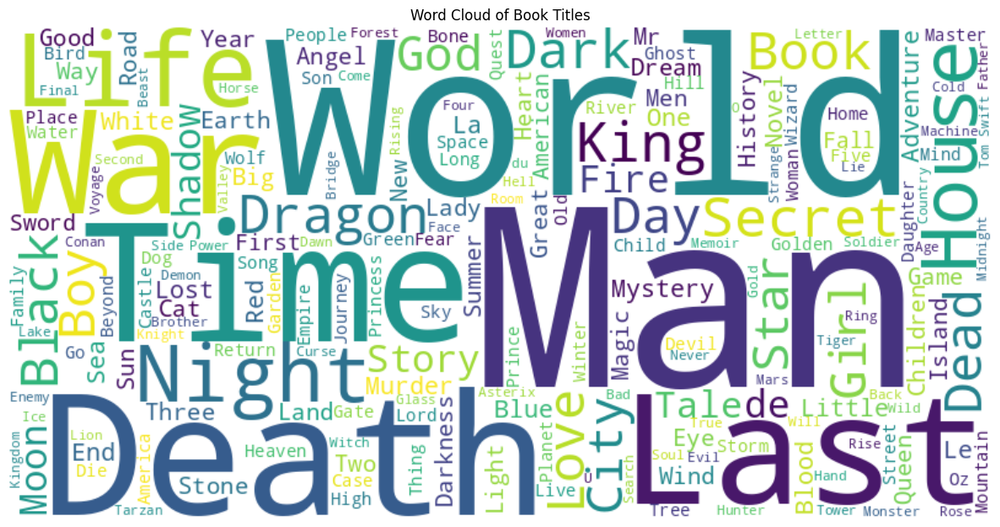

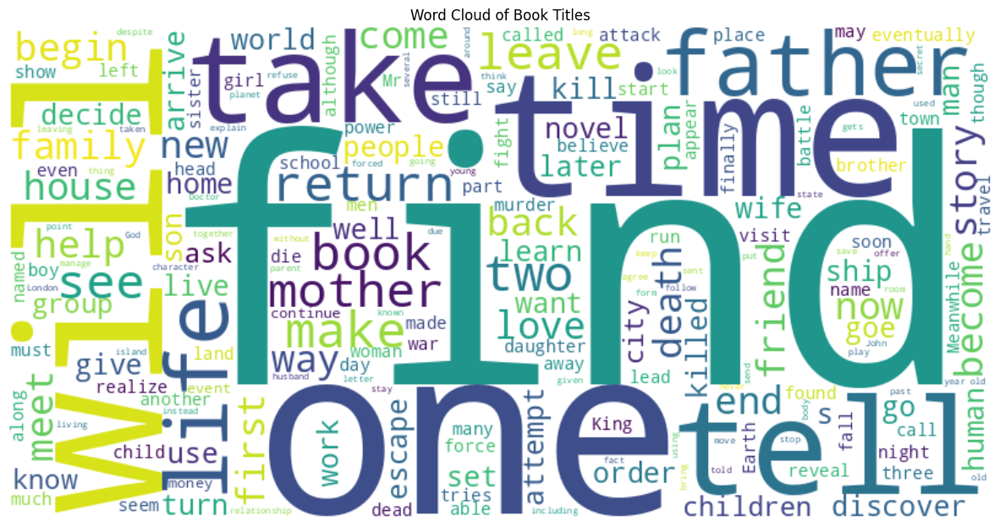

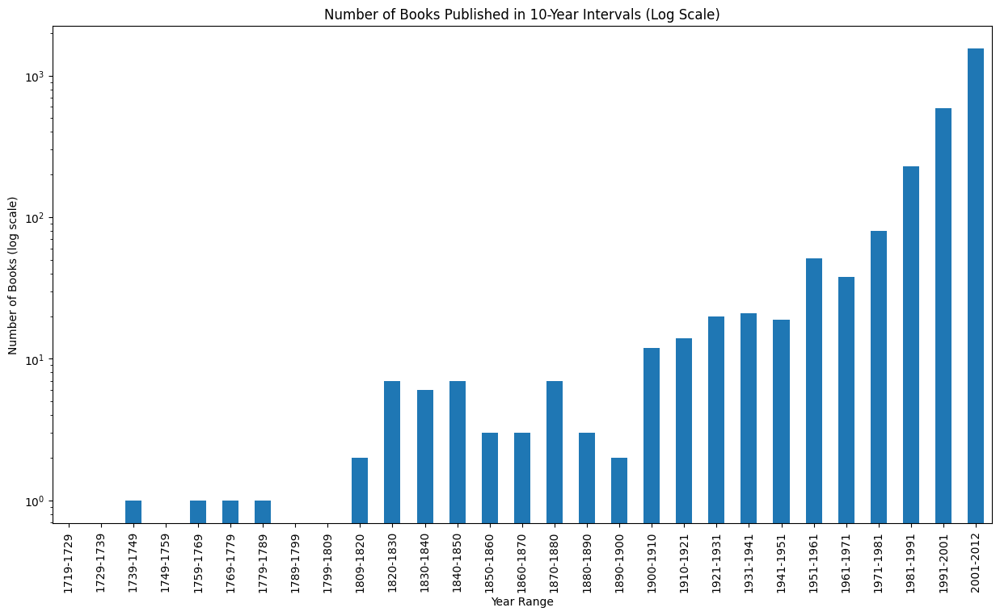

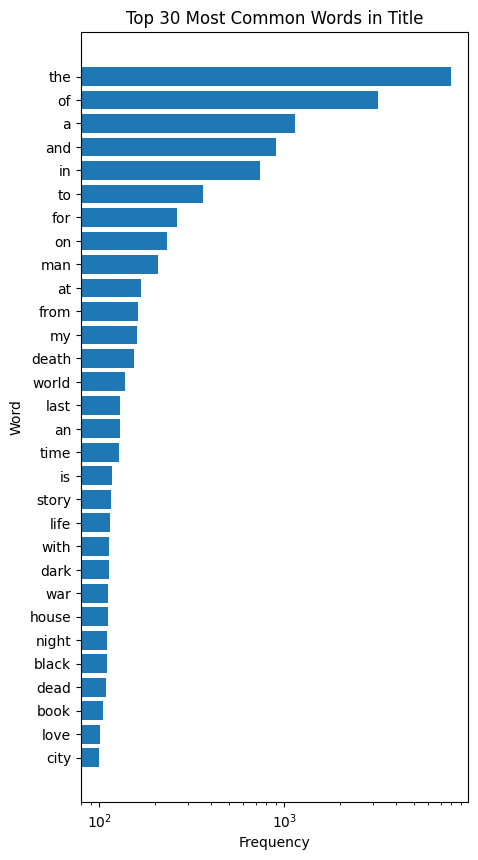

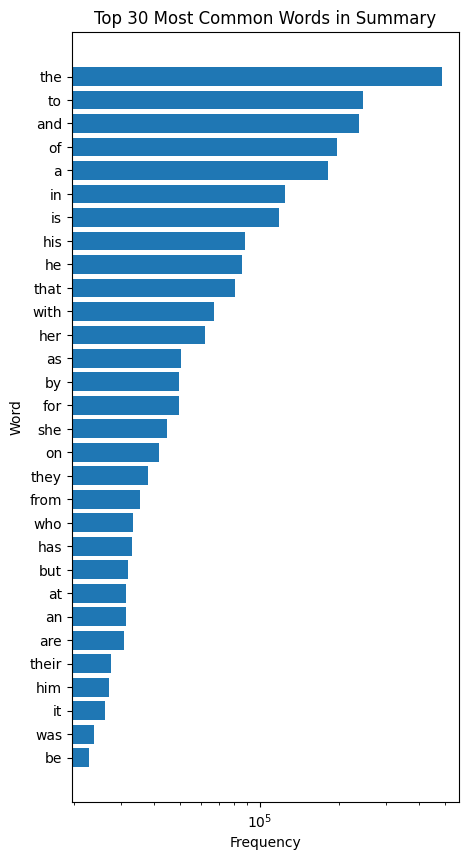

In [ ]:
def explore_data(data):
    describe_lengths(data, 'title')
    describe_lengths(data, 'summary')

    # Word cloud
    word_cloud(data['title'])
    word_cloud(data['summary'])

    # Temporal Analysis
    temporal_analysis(data)

    # Most Common Words
    most_common_words(df_book, 'title')
    most_common_words(df_book, 'summary')

explore_data(df_book)

#### Check nulls

In [ ]:
nuls_count = dict()
for col in df_book.columns:
    nuls_count[col] = len(df_book[df_book[col].isna()])

nuls_count

{'id': 0,
 'Freebase ID': 0,
 'title': 0,
 'author': 2382,
 'date': 13888,
 'genre': 3718,
 'summary': 0,
 'year': 13888,
 'year_bin': 13889}

### Preprocessing

In [ ]:
df_book_texts = df_book[['id', 'title', 'summary']]
df_book_texts

,id,title,summary
0,620,Animal Farm,"Old Major, the old boar on the Manor Farm, ca..."
1,843,A Clockwork Orange,"Alex, a teenager living in near-future Englan..."
2,986,The Plague,The text of The Plague is divided into five p...
3,1756,An Enquiry Concerning Human Understanding,The argument of the Enquiry proceeds by a ser...
4,2080,A Fire Upon the Deep,The novel posits that space around the Milky ...
...,...,...,...
16554,36934824,Under Wildwood,"Prue McKeel, having rescued her brother from ..."
16555,37054020,Transfer of Power,The reader first meets Rapp while he is doing...
16556,37122323,Decoded,The book follows very rough chronological ord...
16557,37132319,America Again: Re-becoming The Greatness We Ne...,Colbert addresses topics including Wall Stree...


In [ ]:
df_book_texts_nulless = df_book_texts.dropna()
df_book_texts_nulless

,id,title,summary
0,620,Animal Farm,"Old Major, the old boar on the Manor Farm, ca..."
1,843,A Clockwork Orange,"Alex, a teenager living in near-future Englan..."
2,986,The Plague,The text of The Plague is divided into five p...
3,1756,An Enquiry Concerning Human Understanding,The argument of the Enquiry proceeds by a ser...
4,2080,A Fire Upon the Deep,The novel posits that space around the Milky ...
...,...,...,...
16554,36934824,Under Wildwood,"Prue McKeel, having rescued her brother from ..."
16555,37054020,Transfer of Power,The reader first meets Rapp while he is doing...
16556,37122323,Decoded,The book follows very rough chronological ord...
16557,37132319,America Again: Re-becoming The Greatness We Ne...,Colbert addresses topics including Wall Stree...


## 2. NLP Component

In [ ]:
tokenizer = T5Tokenizer.from_pretrained("t5-small")
model = T5ForConditionalGeneration.from_pretrained("t5-small").to('cuda')

def shorten_summaries(data, batch_size=512, max_out_length=50):
    shortened_summaries = []
    num_batches = (len(data) + batch_size - 1) // batch_size

    for i in tqdm(range(num_batches)):
        batch = data['summary'][i*batch_size: (i+1)*batch_size]
        inputs = tokenizer.batch_encode_plus(["summarize: " + summary for summary in batch], return_tensors="pt", max_length=max_out_length, truncation=True, padding=True).to('cuda')
        summary_ids = model.generate(inputs.input_ids, max_length=max_out_length, min_length=10, length_penalty=2.0, num_beams=4, early_stopping=True)

        for summary_id in summary_ids:
            condensed_summary = tokenizer.decode(summary_id, skip_special_tokens=True)
            shortened_summaries.append(condensed_summary)

    data_new = data.copy()
    data_new['shortened_summary'] = shortened_summaries
    return data_new

df_book_shortened = shorten_summaries(df_book_texts_nulless)
df_book_shortened

### shortened data

In [16]:
# df_book_shortened.to_csv('./booksummaries_new.csv')

In [17]:
!gdown 1rV32ibbwQ_a7qgnSOievbzCMSAWa5L7l

Downloading...
From: https://drive.google.com/uc?id=1rV32ibbwQ_a7qgnSOievbzCMSAWa5L7l
To: /content/booksummaries_new.csv
100% 44.8M/44.8M [00:00<00:00, 135MB/s]


In [18]:
df_book_shortened = pd.read_csv('./booksummaries_new.csv')
df_book_shortened

,Unnamed: 0,id,title,summary,shortened_summary
0,0,620,Animal Farm,"Old Major, the old boar on the Manor Farm, ca...","Old Major, the old boar on the manor farm, cal..."
1,1,843,A Clockwork Orange,"Alex, a teenager living in near-future Englan...",a teenager leads his gang on nightly orgies of...
2,2,986,The Plague,The text of The Plague is divided into five p...,the text of the Plague is divided into five pa...
3,3,1756,An Enquiry Concerning Human Understanding,The argument of the Enquiry proceeds by a ser...,the argument of the Enquiry proceeds by a seri...
4,4,2080,A Fire Upon the Deep,The novel posits that space around the Milky ...,the novel posits that space around the Milky W...
...,...,...,...,...,...
16554,16554,36934824,Under Wildwood,"Prue McKeel, having rescued her brother from ...",Prue McKeel rescued her brother from the Gover...
16555,16555,37054020,Transfer of Power,The reader first meets Rapp while he is doing...,the reader first meets Rapp while he is doing ...
16556,16556,37122323,Decoded,The book follows very rough chronological ord...,the book follows very rough chronological orde...
16557,16557,37132319,America Again: Re-becoming The Greatness We Ne...,Colbert addresses topics including Wall Stree...,Colbert addresses topics including Wall Street...


In [19]:
describe_lengths(df_book_shortened, 'shortened_summary')

Summary Statistics of shortened_summary:
Minimum length: 1
Mean length: 25.751796606075246
Maximum length: 46



## 3. Computer Vision Component

In [13]:
model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe = pipe.to("cuda")

def text_to_image(text):
    image = pipe(text).images[0]
    return image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [31]:
def image_generation(data, batch_size=4, max_out_length=50):
    images = pd.Series([])
    # num_batches = (len(data) + batch_size - 1) // batch_size
    num_batches = 5

    for i in tqdm(range(num_batches)):
        batch = data['shortened_summary'][i*batch_size: (i+1)*batch_size]
        batch_images = batch.apply(text_to_image)
        images = pd.concat([images, batch_images])

    images.reset_index(drop=True, inplace=True)
    # data_new = data.copy()
    # data_new['image'] = images
    # return data_new
    return images

df_book_images = image_generation(df_book_shortened)
df_book_images

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

0     <PIL.Image.Image image mode=RGB size=512x512 a...
1     <PIL.Image.Image image mode=RGB size=512x512 a...
2     <PIL.Image.Image image mode=RGB size=512x512 a...
3     <PIL.Image.Image image mode=RGB size=512x512 a...
4     <PIL.Image.Image image mode=RGB size=512x512 a...
5     <PIL.Image.Image image mode=RGB size=512x512 a...
6     <PIL.Image.Image image mode=RGB size=512x512 a...
7     <PIL.Image.Image image mode=RGB size=512x512 a...
8     <PIL.Image.Image image mode=RGB size=512x512 a...
9     <PIL.Image.Image image mode=RGB size=512x512 a...
10    <PIL.Image.Image image mode=RGB size=512x512 a...
11    <PIL.Image.Image image mode=RGB size=512x512 a...
12    <PIL.Image.Image image mode=RGB size=512x512 a...
13    <PIL.Image.Image image mode=RGB size=512x512 a...
14    <PIL.Image.Image image mode=RGB size=512x512 a...
15    <PIL.Image.Image image mode=RGB size=512x512 a...
16    <PIL.Image.Image image mode=RGB size=512x512 a...
17    <PIL.Image.Image image mode=RGB size=512x5

## 4. Output

In [57]:
df_final = df_book_shortened[:20]
df_final['image'] = df_book_images
df_final

<ipython-input-57-65f73f7a76e4>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_final['image'] = df_book_images


,Unnamed: 0,id,title,summary,shortened_summary,image
0,0,620,Animal Farm,"Old Major, the old boar on the Manor Farm, ca...","Old Major, the old boar on the manor farm, cal...",<PIL.Image.Image image mode=RGB size=512x512 a...
1,1,843,A Clockwork Orange,"Alex, a teenager living in near-future Englan...",a teenager leads his gang on nightly orgies of...,<PIL.Image.Image image mode=RGB size=512x512 a...
2,2,986,The Plague,The text of The Plague is divided into five p...,the text of the Plague is divided into five pa...,<PIL.Image.Image image mode=RGB size=512x512 a...
3,3,1756,An Enquiry Concerning Human Understanding,The argument of the Enquiry proceeds by a ser...,the argument of the Enquiry proceeds by a seri...,<PIL.Image.Image image mode=RGB size=512x512 a...
4,4,2080,A Fire Upon the Deep,The novel posits that space around the Milky ...,the novel posits that space around the Milky W...,<PIL.Image.Image image mode=RGB size=512x512 a...
5,5,2152,All Quiet on the Western Front,"The book tells the story of Paul Bäumer, a Ge...",the book tells the story of a german soldier w...,<PIL.Image.Image image mode=RGB size=512x512 a...
6,6,2890,A Wizard of Earthsea,"Ged is a young boy on Gont, one of the larger...",ged is a young boy on one of the larger island...,<PIL.Image.Image image mode=RGB size=512x512 a...
7,7,2950,Anyone Can Whistle,The story is set in an imaginary American tow...,the story is set in an imaginary american town...,<PIL.Image.Image image mode=RGB size=512x512 a...
8,8,4081,Blade Runner 3: Replicant Night,"Living on Mars, Deckard is acting as a consul...",Deckard is acting as a consultant to a movie c...,<PIL.Image.Image image mode=RGB size=512x512 a...
9,9,4082,Blade Runner 2: The Edge of Human,Beginning several months after the events in ...,Deckard has retired to an isolated shack outsi...,<PIL.Image.Image image mode=RGB size=512x512 a...


image for book "Animal Farm":


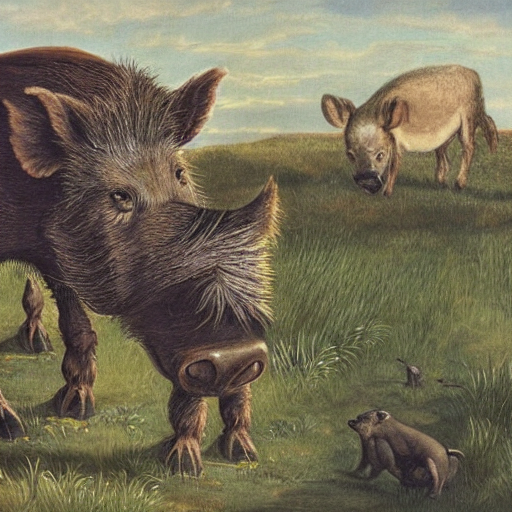


image for book "A Clockwork Orange":


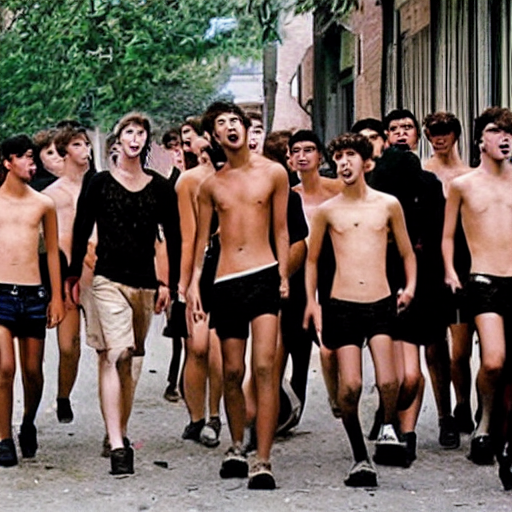


image for book "The Plague":


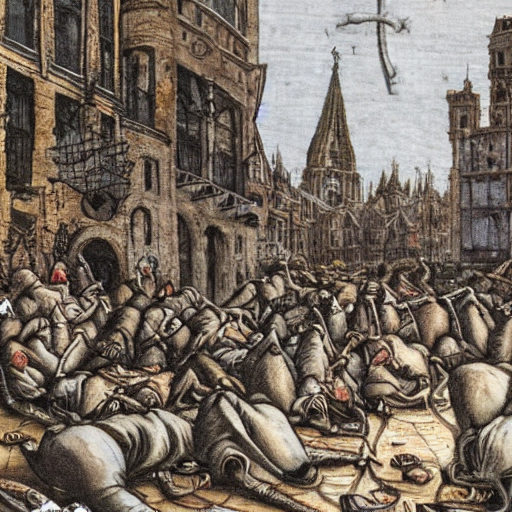


image for book "An Enquiry Concerning Human Understanding":


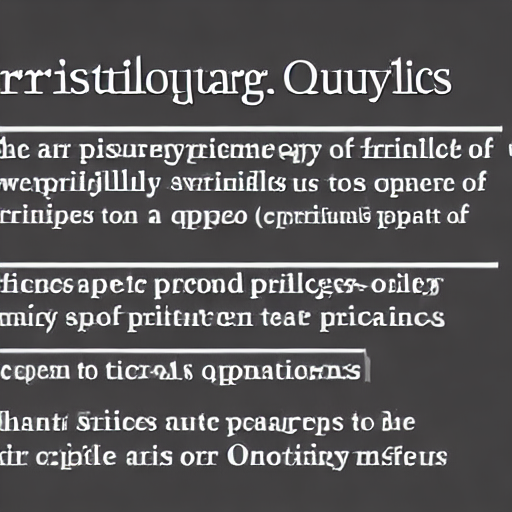


image for book "A Fire Upon the Deep":


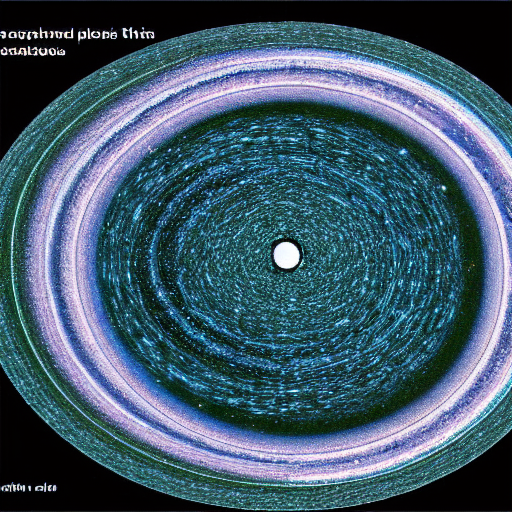


image for book "All Quiet on the Western Front":


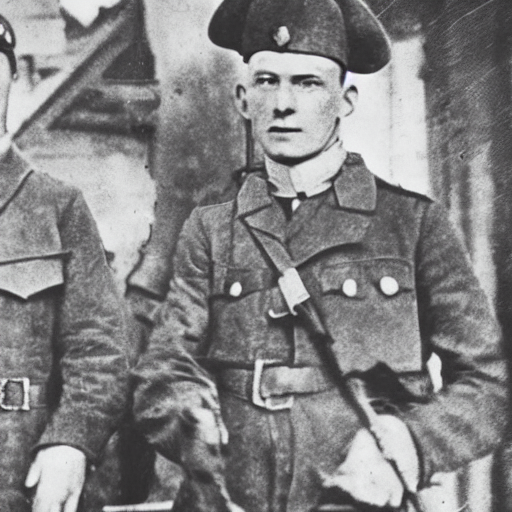


image for book "A Wizard of Earthsea":


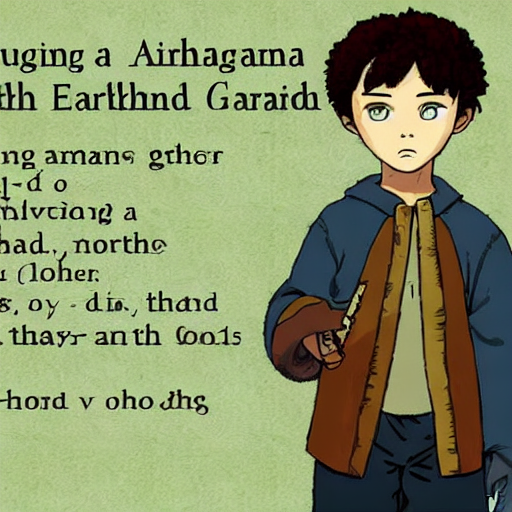


image for book "Anyone Can Whistle":


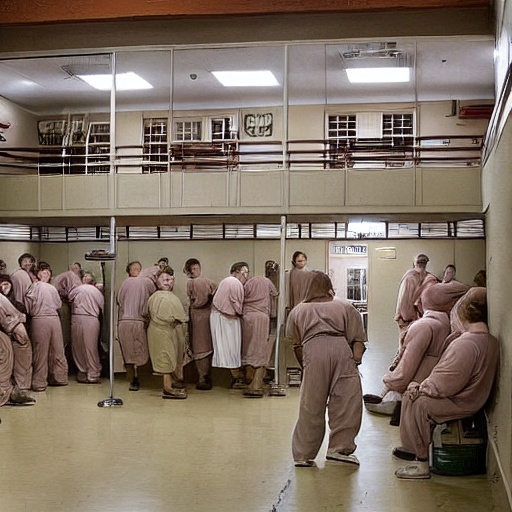


image for book "Blade Runner 3: Replicant Night":


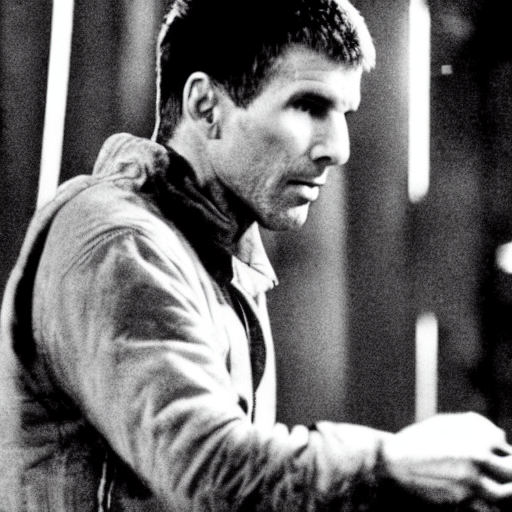


image for book "Blade Runner 2: The Edge of Human":


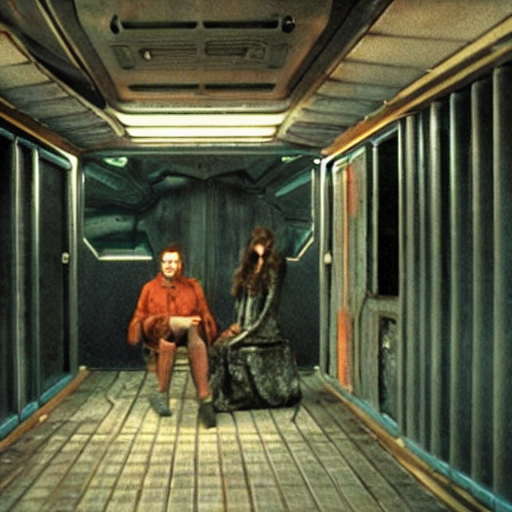


image for book "Book of Joshua":


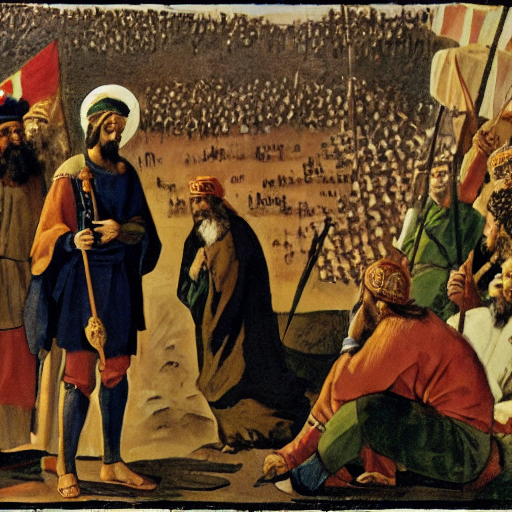


image for book "Book of Ezra":


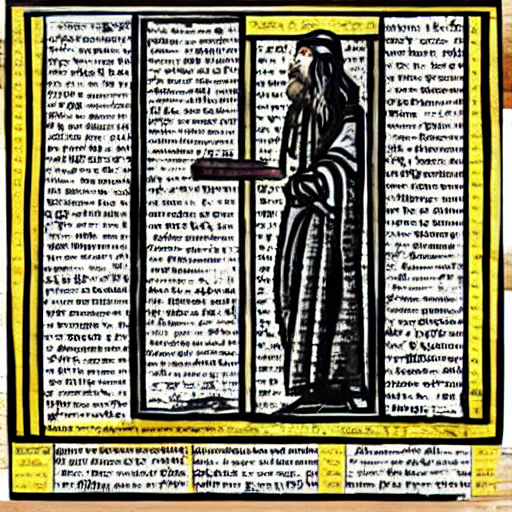


image for book "Book of Numbers":


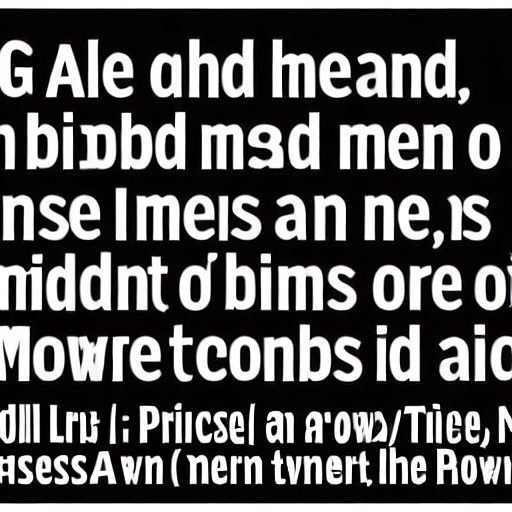


image for book "Book of Ruth":


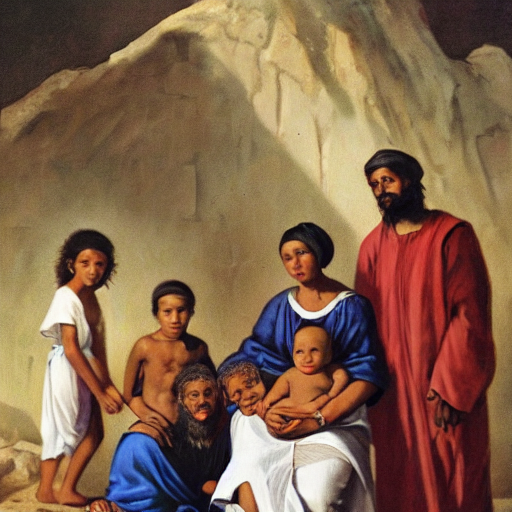


image for book "Book of Esther":


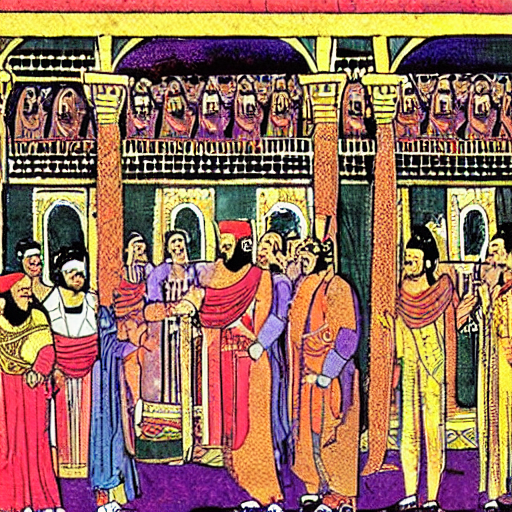


image for book "Book of Job":


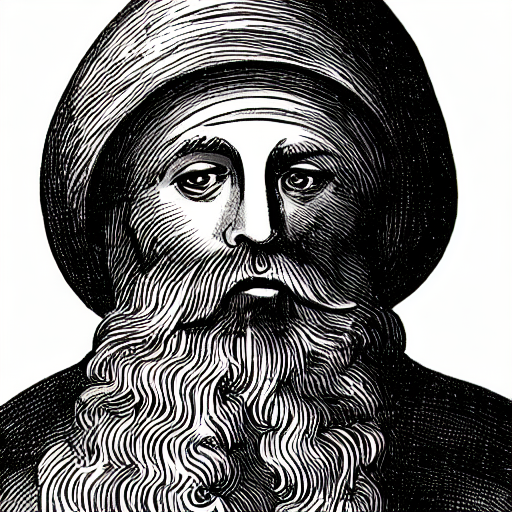


image for book "Book of Hosea":


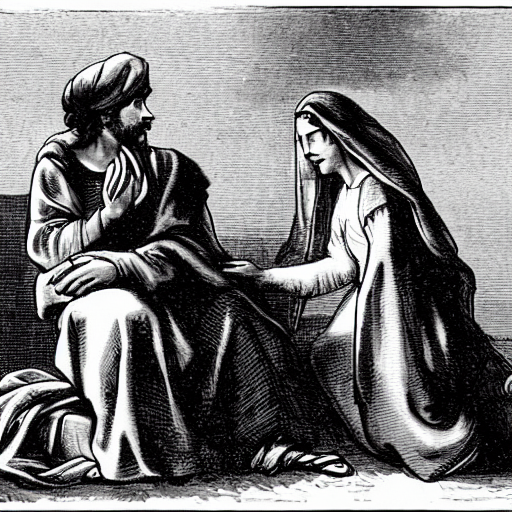


image for book "Book of Jonah":


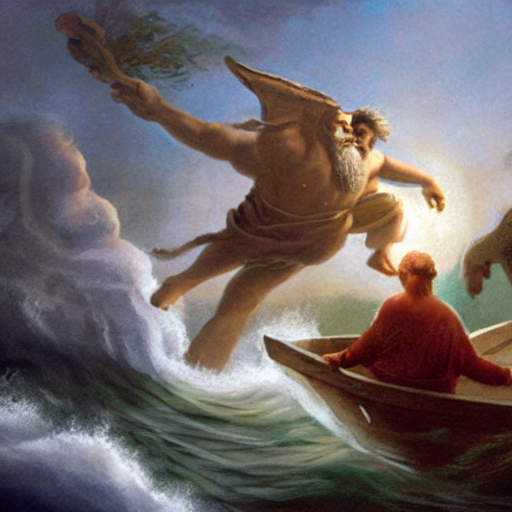


image for book "Book of Micah":


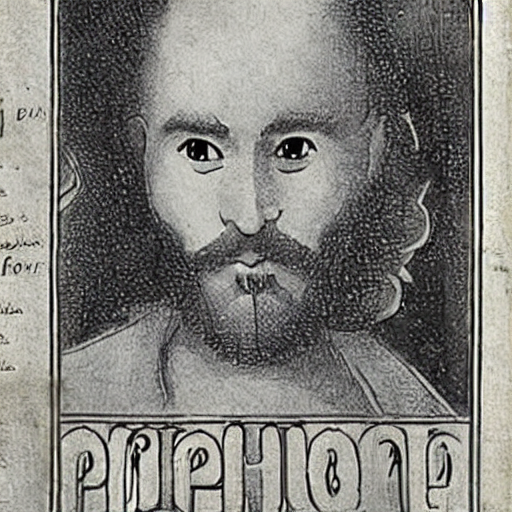


image for book "Book of Haggai":


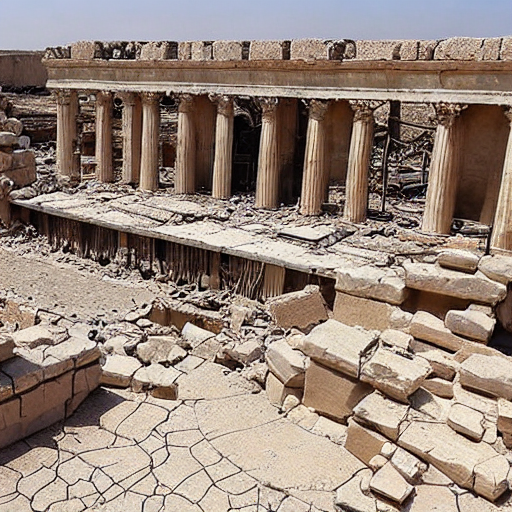

In [63]:
for item in df_final.iterrows():
    print(f"image for book \"{item[1]['title']}\":")
    display(item[1]['image'])
    item[1]['image'].save(f"{'_'.join(item[1]['title'].split(' '))}.png")
    print()